# SYDE 556/750 --- Assignment 5

## Due Date: Dec 2, 2024


**Student ID: 20883350**

*Note:* Please include your numerical student ID only, do *not* include your name.

*Note:* Unlike assignments 1-4, for this assignment the full instructions (including some hints) are in this file.  The cells you need to fill out are marked with a "writing hand" symbol. Of course, you can add new cells in between the instructions, but please leave the instructions intact to facilitate marking.

- This assignment is worth 30 marks (30% of the final grade). The number of marks for each question is indicated in brackets to the left of each question.

- Clearly label any plot you produce, including the axes. Provide a legend if there are multiple lines in the same plot.

- You won’t be judged on the quality of your code.

- All questions use the nengo default of Leaky Integrate-and-Fire neurons with the default parameter settings (`tau_rc=0.02` and `tau_ref=0.002`).

- Make sure to execute the Jupyter command “Restart Kernel and Run All Cells” before submitting your solutions. You will lose marks if your code fails to run or produces results that differ significantly from what you’ve submitted.

- Rename the completed notebook to `syde556_assignment_05_<STUDENT ID>.ipynb` and submit it via email to the TA (Graeme Damberger <graeme.damberger@uwaterloo.ca>). The deadline is at 23:59 EST on Dec 2, 2024.

- There is a late penalty of one mark per day late. Please contact celiasmith@uwaterloo.ca if there are extenuating circumstances.

- **For this assignment, you must use [Nengo](https://www.nengo.ai/getting-started/).** Feel free to look through the examples folder and/or the tutorials on the Nengo website before doing this assignment.



In [1]:
# Import numpy and matplotlib
import numpy as np
import matplotlib.pyplot as plt

import nengo

# Fix the numpy random seed for reproducible results
np.random.seed(18945)

# Some formating options
%config InlineBackend.figure_formats = ['svg']

# 1. Building an Accumulate-to-Threshold Decision Making Model

One standard account for how brains make simple decision-making tasks is that they gradually accumulate evidence for or against something, and when that evidence hits some threshold, a decision is made.  This sort of model is used to account for the fact that people take longer to make decisions when the evidence is weak.

If you want more background on this, https://www.jneurosci.org/content/34/42/13870 gives a decent overview, but this diagram shows a high-level overview:

![](https://www.jneurosci.org/content/jneuro/34/42/13870/F1.large.jpg)

We're going to make a model of this process. It will make its choice based on a single input value, which gives some evidence as to which choice should be made.  It will indicate a choice by outputting either a 1 or a -1.  If that input evidence is positive, it will be more likely to make the first choice (outputting a 1), and if the input evidence is negative it will be more likely to make the second choice (outputting a -1).

*TIP: The Nengo GUI built-in tutorials 10 through 18 may be useful to give you an overview of different recurrent systems and different ways of modifying ```Ensembles```.*



**a) Accumulation. [2 marks]** Start by building a recurrent system that can add up evidence over time (the accumulator or integrator).  This is a neural ```Ensemble``` that holds a single dimension, and uses a small number of neurons (50).  Provide it with one input ```Node``` that has a constant value of ```[0.1]``` and connect that input into the ```Ensemble``` with a ```Connection```.  Now make a ```Connection``` from the ```Ensemble``` back to itself that computes the identity function.  Since this ```Connection``` is accumulating evidence over time, we want it to be fairly stable, so set ```synapse=0.1``` on this ```Connection``` (leave the other `Connection` at its default value).  This means that the neurotransmitter being used will spread out over 100ms, rather than the default 5ms.

If you run the above system with the constant positive input of 0.1 as noted above, the value stored in the accumulator should gradually increase until it hits 1 (this should take about 1 second of simulated time).  If you change the input to be -0.1, it should gradually decrease until it hits -1.

Make a single plot that shows the behaviour of the model for four different inputs: 0.2, 0.1, -0.1, and -0.2.  For each input, run the model for 2 seconds (`sim.run(2)`) and plot the value stored in the accumulator `Ensemble`.  Use a `Probe` synapse of 0.01 to get the stored value.

In [2]:
def run_accumulator(input, radius = 1):
    model = nengo.Network(seed=8)

    with model:
        # create first ensemble
        ens_1 = nengo.Ensemble(
            n_neurons = 50,
            dimensions = 1,
            radius = radius
        )

        neural_input = nengo.Node(input)

        # connections for the accumulator
        stim_conn = nengo.Connection(neural_input, ens_1)
        recurrent_conn = nengo.Connection(ens_1, ens_1, function = lambda x: x, synapse = 0.1)

        # create probes
        # input_probe = nengo.Probe(neural_input, synapse=0.01)
        ens1_probe = nengo.Probe(ens_1, synapse=0.01)

    with nengo.Simulator(model) as sim:
        sim.run(2)

    # plt.figure()
    plt.plot(sim.trange(), sim.data[ens1_probe], label=f"Ensemble Value For Input = {input}")
    # plt.plot(sim.trange(), sim.data[input_probe], label="Input")
    plt.title("Plot of Accumulator")
    plt.legend()
    plt.grid(True)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

Text(0.5, 1.0, 'Plot of Accumulator Values for Varying Input')

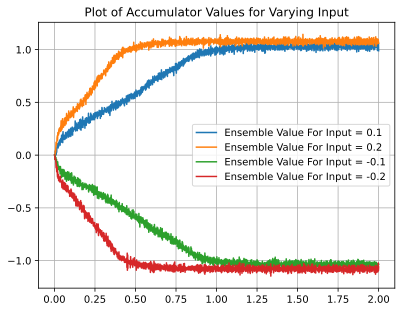

In [3]:
run_accumulator(0.1)
run_accumulator(0.2)
run_accumulator(-0.1)
run_accumulator(-0.2)
plt.title("Plot of Accumulator Values for Varying Input")

**b) Accumulator Discussion. [1 mark]** What is the mathematical computation being performed here (i.e. what is the relationship between the input and the output)?  Why does the value stop increasing (or decreasing) when it hits +1 (or -1)?

The computation being performed is that of a neural accumulator. We can see that for 0.1, it accumulates approximates 10 times faster, thus output = input * integral(10 * dt) => output = input * 10 * t. This relationship is approximated by the ensemble as the neurons are not exactly following this relationship, but it is what they are trying to represent. The values stop increasing when it hits +1 because the neurons saturate at this point; their radius is only set to 1 so they are unable to represent values above 1 (or -1 when decreasing). This can be fixed by setting radius = 2, as shown below (so they don't saturate until a value of 2).

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

Text(0.5, 1.0, 'Plot of Accumulator Values for Varying Input')

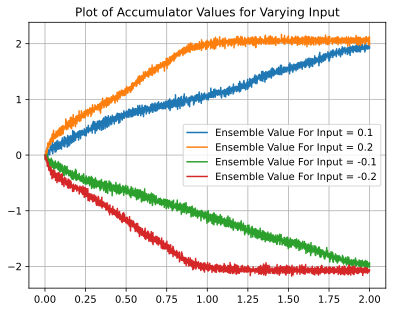

In [4]:
run_accumulator(0.1, radius=2)
run_accumulator(0.2, radius=2)
run_accumulator(-0.1, radius=2)
run_accumulator(-0.2, radius=2)
plt.title("Plot of Accumulator Values for Varying Input")

**c) Adding random noise to the neurons. [1 mark]** Next, we can add randomness to the neurons.  In standard (non-neural) accumulator models, there is a "random-walk" component that randomly varies the value being accumulated.  We can model this by adding random noise into the ```Ensemble```, which means adding random current to each of the neurons.  The command for this is:

```python
acc.noise = nengo.processes.WhiteSignal(period=10, high=100, rms=1)
```

(where ```acc``` is whatever name you gave your accumulator ```Ensemble```.)

The strength of this noise is set by the ```rms=1``` parameter.  Generate the same plot as in part (a) but with the noise `rms=1`.  Also generate the same plot for `rms=3`, `rms=5`, and `rms=10`.  What happens to the resulting output?

In [5]:
def run_accumulator_noise(input, rms, radius = 1):
    model = nengo.Network(seed=8)

    with model:
        # create first ensemble
        ens_1 = nengo.Ensemble(
            n_neurons = 50,
            dimensions = 1,
            radius = radius
        )

        ens_1.noise = nengo.processes.WhiteSignal(period=10, high=100, rms=rms)

        neural_input = nengo.Node(input)

        # connections for the accumulator
        stim_conn = nengo.Connection(neural_input, ens_1)
        recurrent_conn = nengo.Connection(ens_1, ens_1, function = lambda x: x, synapse = 0.1)

        # create probes
        # input_probe = nengo.Probe(neural_input, synapse=0.01)
        ens1_probe = nengo.Probe(ens_1, synapse=0.01)

    with nengo.Simulator(model) as sim:
        sim.run(2)

    # plt.figure()
    plt.plot(sim.trange(), sim.data[ens1_probe], label=f"Ensemble Value For Input = {input}")
    # plt.plot(sim.trange(), sim.data[input_probe], label="Input")
    plt.title(f"Plot of Accumulator With RMS Noise = {rms}")
    plt.legend()
    plt.grid(True)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

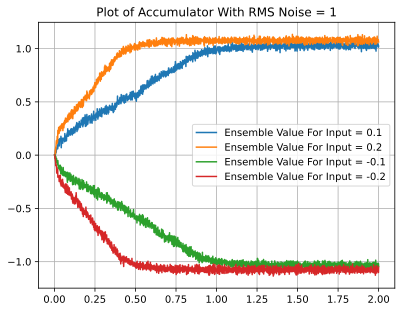

In [6]:
accum_inputs = [0.1, 0.2, -0.1, -0.2]
for input in accum_inputs:
    run_accumulator_noise(input, 1)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

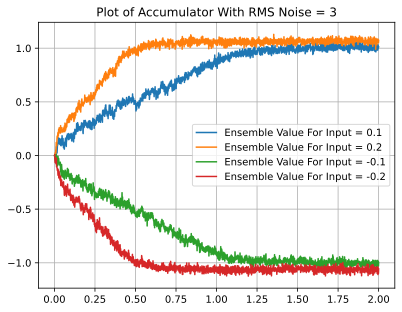

In [7]:
for input in accum_inputs:
    run_accumulator_noise(input, 3)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

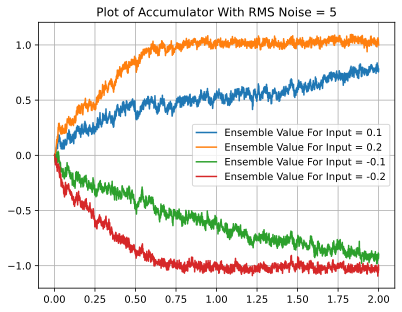

In [8]:
for input in accum_inputs:
    run_accumulator_noise(input, 5)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

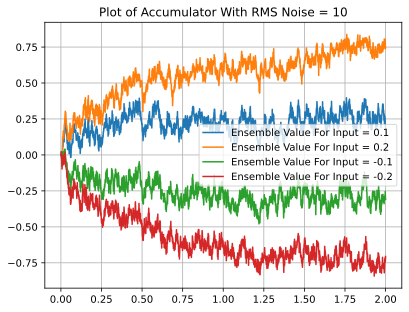

In [9]:
for input in accum_inputs:
    run_accumulator_noise(input, 10)

As expected, when we increase the RMS, the output plots get more an more noisy (which is what we were trying to model; some random variance in the value being accumulated). Of interesting note, RMS = 1 and 3 don't change the output plots much... but as we get to RMS = 5, 10 we can see that the accumulator is not able to keep up to it's set value. The amount of noise is so high that it seems to drop the value that the accumulator is attempting to reach.

**e) Adding decision-making. [1 mark]** To complete the basic model, we want to determine when this accumulator passes some threshold.  If the value becomes large enough, we should make one choice (+1), and if it becomes small enough we should make the other choice (-1).  To achieve this, make a new output ```Ensemble``` that is also one-dimensional and has 50 neurons.  Form a ```Connection``` from the accumulator to this new ```Ensemble``` that computes the following function:

```python
def choice(x):
    if x[0] > 0.9:
        return 1
    elif x[0] < -0.9:
        return -1
    else: 
        return 0
```

This new output should now stay at zero until the accumulator value gets large enough, and then quickly move to +1 or -1.

Build this model and plot the output of both the accumulator `Ensemble` and the decision-making `Ensemble`.  Use a noise `rms=3` and for both `Probe`s use a synapse of 0.01.  Do this for all four input values (0.2, 0.1, -0.1, and -0.2).

How well does the system perform?  Does it make decisions faster when there is stronger evidence?  What differences are there (if any) between the computation we are asking the system to perform and the actual result?

*TIP: try running the model a few times to see the variability in the output*

In [10]:
def run_decision_model(input, rms = 3, radius = 1, seed=8):
    model = nengo.Network(seed=seed)

    with model:
        # create first ensemble
        acc_ens = nengo.Ensemble(
            n_neurons = 50,
            dimensions = 1,
            radius = radius
        )

        decision_ensemble = nengo.Ensemble(
            n_neurons=50,
            dimensions=1
        )

        def choice(x):
            if x[0] > 0.9:
                return 1
            elif x[0] < -0.9:
                return -1
            else: 
                return 0

        acc_ens.noise = nengo.processes.WhiteSignal(period=10, high=100, rms=rms)

        neural_input = nengo.Node(input)

        # connections for the accumulator
        stim_conn = nengo.Connection(neural_input, acc_ens)
        recurrent_conn = nengo.Connection(acc_ens, acc_ens, function = lambda x: x, synapse = 0.1)
        decision_conn = nengo.Connection(acc_ens, decision_ensemble, function=choice)

        # create probes
        # input_probe = nengo.Probe(neural_input, synapse=0.01)
        acc_probe = nengo.Probe(acc_ens, synapse=0.01)
        decision_probe = nengo.Probe(decision_ensemble, synapse=0.01)

    with nengo.Simulator(model) as sim:
        sim.run(2)

    # plt.figure()
    plt.plot(sim.trange(), sim.data[acc_probe], label=f"Accumulator Value For Input = {input}")
    plt.plot(sim.trange(), sim.data[decision_probe], label=f"Decision Value for Input = {input}")
    plt.title(f"Plot of Decision-Making Model")
    plt.legend()
    plt.grid(True)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

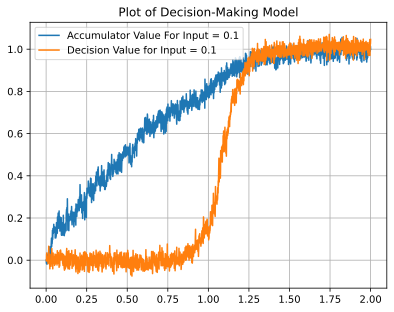

In [11]:
run_decision_model(0.1)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

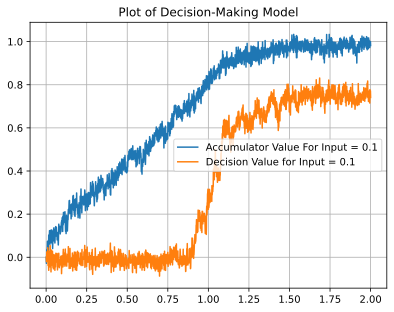

In [12]:
run_decision_model(0.1, seed=17)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

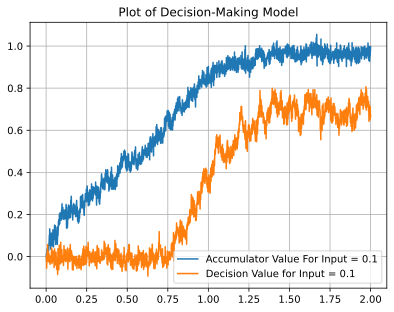

In [13]:
run_decision_model(0.1, seed=28)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

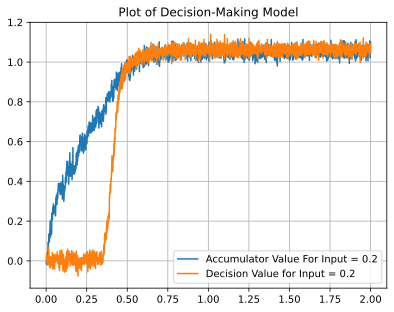

In [14]:
run_decision_model(0.2)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

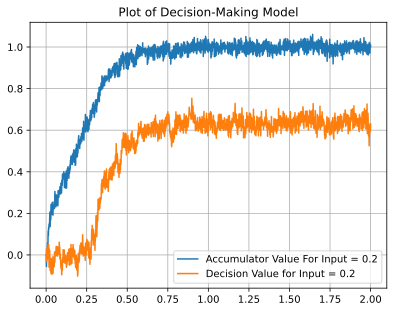

In [15]:
run_decision_model(0.2, seed=18)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

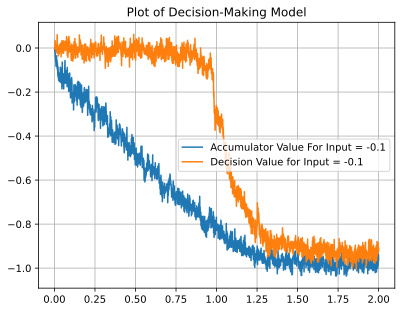

In [16]:
run_decision_model(-0.1)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

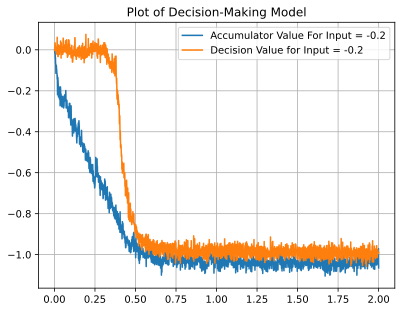

In [17]:
run_decision_model(-0.2)

With the initial seed set (seed = 8), the system seems to perform quite well at computing the decision making model - as we see a quick response at the decision threshold and a response value that is very close to 1/-1. However, on changing the seed value, it is evident that othere seeds are performing quite poorly; there is a lag in the decision since the decision model starts to rise too early, and also never reaches it's final value. This seems to be a bad decision maker, as it begins to make a decision too early, and is not sure of itself after it has made a decision.

**f) Combining Ensembles. [1 mark]** An alternative implementation would be to combine the two separate 1-dimensional `Ensembles` into one 2-dimensional `Ensemble`.  The Connections are made similarly as in the original model, but they need to target the particular dimensions involved using the ```ens[0]``` and ```ens[1]``` syntax.  Try building the model this way and plot the results.  Do this for a single `Ensemble` with 100 neurons (the same number as the total number of neurons in the original model) and with 500 neurons.  Also, be sure to increase the `radius` as would be appropriate in order to produce values like what we had in the original model, where the accumulator might be storing a 1 and the output might be a 1.

How does combining Ensembles in this way change the performance of the system?  

When the Ensembles are combined together in this way, what are we changing about the biological claims about the model?  In particular, how might we determine whether the real biologicial system has these as separate `Ensembles` or combined together?

In [18]:
def run_decision_model_2D(input, n_neurons, rms = 3, radius = np.sqrt(2), seed=8):
    # note, to represent the vector [1, 1] we need a radius = sqrt(1 + 1) = sqrt(2)
    model = nengo.Network(seed=seed)

    with model:
        ens = nengo.Ensemble(
            n_neurons = n_neurons,
            dimensions = 2,
            radius = radius
        )


        def choice(x):
            if x[0] > 0.9:
                return 1
            elif x[0] < -0.9:
                return -1
            else: 
                return 0

        ens[0].noise = nengo.processes.WhiteSignal(period=10, high=100, rms=rms)

        neural_input = nengo.Node(input)

        # connections for the accumulator
        stim_conn = nengo.Connection(neural_input, ens[0])
        recurrent_conn = nengo.Connection(ens[0], ens[0], function = lambda x: x, synapse = 0.1)
        decision_conn = nengo.Connection(ens[0], ens[1], function=choice)

        # create probes
        # input_probe = nengo.Probe(neural_input, synapse=0.01)
        acc_probe = nengo.Probe(ens[0], synapse=0.01)
        decision_probe = nengo.Probe(ens[1], synapse=0.01)

    with nengo.Simulator(model) as sim:
        sim.run(2)

    # plt.figure()
    plt.plot(sim.trange(), sim.data[acc_probe], label=f"Accumulator Value For Input = {input}")
    plt.plot(sim.trange(), sim.data[decision_probe], label=f"Decision Value for Input = {input}")
    plt.title(f"Plot of Decision-Making Model")
    plt.legend()
    plt.grid(True)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

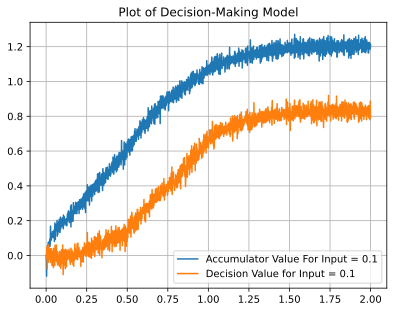

In [19]:
run_decision_model_2D(0.1, 100, seed=8)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

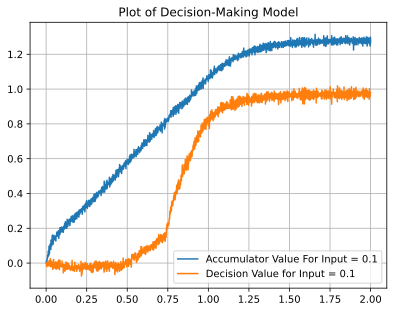

In [20]:
run_decision_model_2D(0.1, 500, seed=8)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

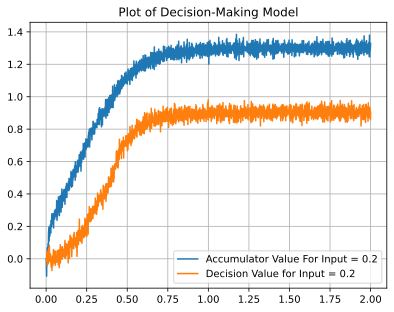

In [21]:
run_decision_model_2D(0.2, 100, seed=8)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

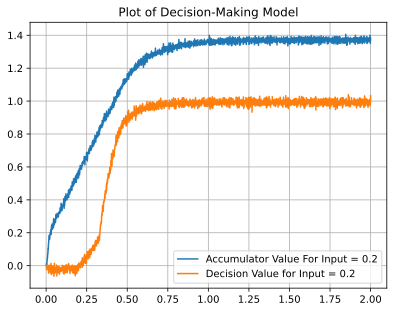

In [22]:
run_decision_model_2D(0.2, 500, seed=8)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

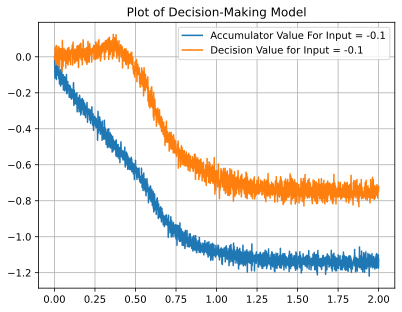

In [23]:
run_decision_model_2D(-0.1, 100, seed=8)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

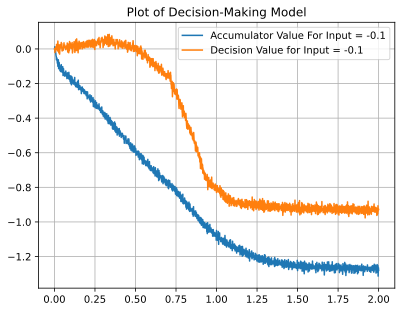

In [24]:
run_decision_model_2D(-0.1, 500, seed=8)

Questions from Above: How does combining Ensembles in this way change the performance of the system?  

The performance of the system is relatively similar with 500 neurons, but worse with 100 neurons. With the same number of neurons (100) in only 1 ensemble, the decision threshold time is quite long (not good) as appears to follow the accumulator in a slower manner. When we increase the number of neurons to 500, it performs more similarly to the 2 ensemble implementation, where it does reach the final value and rises up quickly. However, one thing to note is that in this implementation, the accumulator is able to reach a slightly higher value as the representation of the 2 concepts are linked by the same radius. Since the decision threshold takes some time to rise, the accumulator rises above and reaches a higher value.

When the Ensembles are combined together in this way, what are we changing about the biological claims about the model?  In particular, how might we determine whether the real biologicial system has these as separate `Ensembles` or combined together?

When combined in this way, we are biologically implying that the representation is dynamical and computing the same concept in one group of neurons, rather than the decision being causal - recieving the spikes from a separate group of neurons and then deciding what to do (recurrent connections in a 2D population of different dimensions vs feed forward connection with two 1D populations). We might determine whether the real biological system has them combined by looking at the final value reached. As I said above, if they reach the same final value, it is likely 2 groups of neurons saturating separately, whereas different final values might show a representation in higher dimensions saturating together.

**g) Improving Representation [1 mark].** Returning to the original implementation from section (e) (with 2 separate Ensembles), we can improve the performance by adjusting the tuning curves of the second `Ensemble`.  Do this by setting `intercepts = nengo.dists.Uniform(0.4, 0.9)`.  This randomly chooses the x-intercepts of the neurons uniformly between 0.4 and 0.9, rather than the default of -1 to 1.  Generate the same plot as in part (e).

How does this affect the performance of the model?  (Try running the model a few times to see the variability in performance). 

Why does the output stay at exactly zero up until the decision is made (rather than being randomly jittering around zero, as in the previous models)?  

Why couldn't we use this approach in the case from part (f) where the `Ensembles` are combined?

In [25]:
def run_decision_model_vary_intercepts(input, rms = 3, radius = 1, seed=8):
    model = nengo.Network(seed=seed)

    with model:
        # create first ensemble
        acc_ens = nengo.Ensemble(
            n_neurons = 50,
            dimensions = 1,
            radius = radius
        )

        decision_ensemble = nengo.Ensemble(
            n_neurons=50,
            dimensions=1,
            intercepts=nengo.dists.Uniform(0.4, 0.9)
        )

        def choice(x):
            if x[0] > 0.9:
                return 1
            elif x[0] < -0.9:
                return -1
            else: 
                return 0

        acc_ens.noise = nengo.processes.WhiteSignal(period=10, high=100, rms=rms)

        neural_input = nengo.Node(input)

        # connections for the accumulator
        stim_conn = nengo.Connection(neural_input, acc_ens)
        recurrent_conn = nengo.Connection(acc_ens, acc_ens, function = lambda x: x, synapse = 0.1)
        decision_conn = nengo.Connection(acc_ens, decision_ensemble, function=choice)

        # create probes
        # input_probe = nengo.Probe(neural_input, synapse=0.01)
        acc_probe = nengo.Probe(acc_ens, synapse=0.01)
        decision_probe = nengo.Probe(decision_ensemble, synapse=0.01)

    with nengo.Simulator(model) as sim:
        sim.run(2)

    # plt.figure()
    plt.plot(sim.trange(), sim.data[acc_probe], label=f"Accumulator Value For Input = {input}")
    plt.plot(sim.trange(), sim.data[decision_probe], label=f"Decision Value for Input = {input}")
    plt.title(f"Plot of Decision-Making Model")
    plt.legend()
    plt.grid(True)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

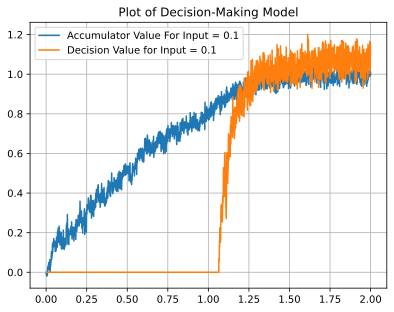

In [26]:
run_decision_model_vary_intercepts(0.1)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

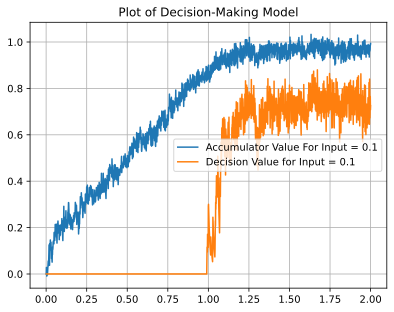

In [27]:
run_decision_model_vary_intercepts(0.1, seed=56)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

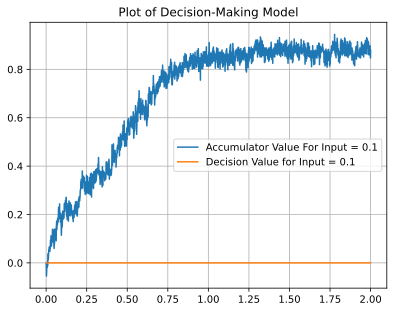

In [28]:
run_decision_model_vary_intercepts(0.1, seed=27)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

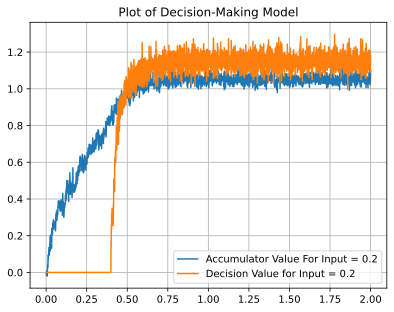

In [29]:
run_decision_model_vary_intercepts(0.2)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

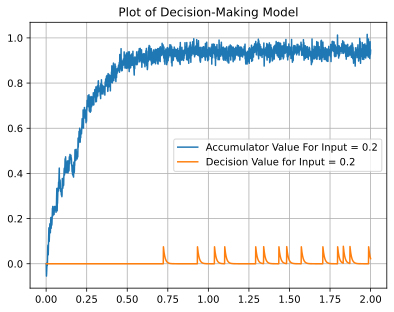

In [30]:
run_decision_model_vary_intercepts(0.2, seed=27)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

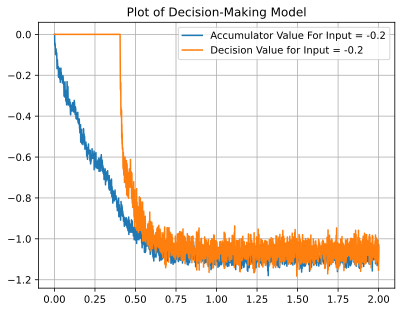

In [31]:
run_decision_model_vary_intercepts(-0.2, seed=27)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

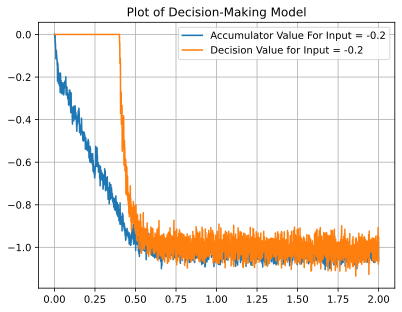

In [32]:
run_decision_model_vary_intercepts(-0.2)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

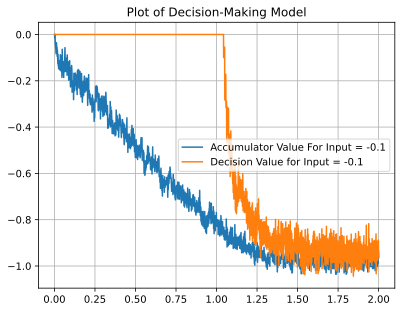

In [33]:
run_decision_model_vary_intercepts(-0.1)

Questions: How does this affect the performance of the model?  (Try running the model a few times to see the variability in performance). 

On a good seed, the model performs quite well as there is a clear distinction between no decision and decision. The value represented before decision is literally 0 with no noise, which makes it clear. However, one model (with a different seed) literally showed no decision at all when a decision should have been made. In this case, the model performs much worse... since it did nothing. In general, we can say the model performs poorly since this type of variability exists.

Why does the output stay at exactly zero up until the decision is made (rather than being randomly jittering around zero, as in the previous models)?  

The output stays at 0 since no lif neurons have any values between -0.4 and 0.4 (as a result of where we set the intercepts). Thus, when noise under 0.4 is attempting to be represented, the neurons have no output as a result of their intercepts.

Why couldn't we use this approach in the case from part (f) where the `Ensembles` are combined?

This approach could not be used when the ensembles are combined since this would mean that the accumulator ensemble would only have intercepts between 0.4 and 0.9. Since the accumulator starts at 0, the ensemble would not be able to represent the onset of the accumulator (between 0 -> about 0.4) which is not a good accumulator model.

# 2. Temporal Representation

In class, we discussed the Legendre Memory Unit (LMU), a method for storing input information over time.  This allows us to make connections where the function being computed is a function of the input over some window in time, rather having to be a function of the current input.

In this question, we will use this to build a model that can distinguish a 1Hz sine wave from a 2Hz sine wave.  Notice that it is impossible to perform this task without having information over time; if I just give you a single number at any given point in time, you can't tell whether it's from a 1Hz sine wave or a 2Hz sine wave.  So we need some method to store the previous input information, and that's what the LMU does.

**a) Representing Information over Time. [2 marks]** The core of the LMU is to compute the differential equation ${dx \over dt} = Ax + Bu$ where $A$ and $B$ are carefully chosen using the following math:

```python
A = np.zeros((q, q))
B = np.zeros((q, 1))
for i in range(q):
    B[i] = (-1.)**i * (2*i+1)
    for j in range(q):
        A[i,j] = (2*i+1)*(-1 if i<j else (-1.)**(i-j+1)) 
A = A / theta
B = B / theta        
```

Implement this in Nengo.  Use `theta=0.5` and `q=6`.  The model should consist of a single `Ensemble` that is `q`-dimensional. Use 1000 neurons in this `Ensemble`.  Use `synapse=0.1` on both the recurrent `Connection` and on the input `Connection`.

For the input, give a 1Hz sine wave for the first 2 seconds, and a 2Hz sine wave for the second 2 seconds.  This can be done with:

```python
stim = nengo.Node(lambda t: np.sin(2*np.pi*t) if t<2 else np.sin(2*np.pi*t*2))
```

Run the simulation for 4 seconds.  Plot `x` over the 4 seconds using a `Probe` with `synapse=0.01`.  `x` should be 6-dimensional, and there should be a noticable change between its value before `t=2` and after `t=2`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

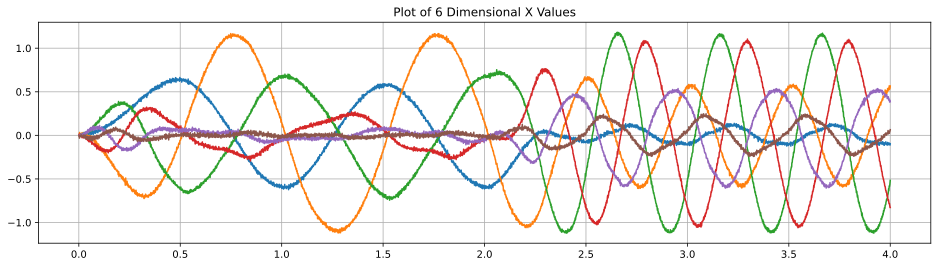

In [34]:
q = 6
theta = 0.5
tau = 0.1

model = nengo.Network(seed=8)

with model:
    ens = nengo.Ensemble(
        n_neurons = 1000,
        dimensions = q,
    )

    A = np.zeros((q, q))
    B = np.zeros((q, 1))
    for i in range(q):
        B[i] = (-1.)**i * (2*i+1)
        for j in range(q):
            A[i,j] = (2*i+1)*(-1 if i<j else (-1.)**(i-j+1)) 
    A = A / theta
    B = B / theta

    # we must now compute A' and B' for neural transformations
    A_prime =  tau * A + np.eye(q)
    B_prime = tau * B

    stim = nengo.Node(lambda t: np.sin(2*np.pi*t) if t<2 else np.sin(2*np.pi*t*2))

    # connections for the accumulator
    stim_conn = nengo.Connection(stim, ens, function = lambda u: B_prime @ u, synapse=tau)
    recurrent_conn = nengo.Connection(ens, ens, function = lambda x: A_prime @ x, synapse = tau)

    # create probes
    ens_probe = nengo.Probe(ens, synapse=0.01)

with nengo.Simulator(model) as sim:
    sim.run(4)

x_values = sim.data[ens_probe]
plt.figure(figsize=(16, 4))
plt.plot(sim.trange(), x_values)
# plt.plot(sim.trange(), sim.data[decision_probe], label=f"Decision Value for Input = {input}")
plt.title(f"Plot of {q} Dimensional X Values")
# plt.legend()
plt.grid(True)

**b) Computing the function. [2 marks]** We now want to compute our desired function, which is "output a 1 if we have a 1Hz sine wave and a 0 if we have a 2Hz sine wave".  To do this, we need to make a `Connection` from the LMU `Ensemble` out to a new `Ensemble` that will be our category.  Have it be 1-dimensional with 50 neurons.

Normally in Nengo, when we define a `Connection` we specify a Python function that we want to approximate.  Nengo will then choose a bunch of random `x` values, call the function to determine what the output should be for each one, and use that to solve for the decoders.  However, in this case, we already have that set of `x` values!  That's exactly the data you plotted in part (a).  For the `x` values from t=0 to t=2.0 we want an output of 1.  For the `x` values from t=2.0 to t=4.0, we want an output of -1.  So, to specify these target values, we make a matrix of size `(4000,1)` (4000 for the 4000 time steps that you have `x` values for, and 1 for the output being 1-dimensional).  Set the first 2000 values to 1 and the second 2000 values to -1.

Now that you have your `x` values and the corresponding `target` values, you can tell Nengo to use them when you make the `Connection` like this:

```python
nengo.Connection(a, b, eval_points=x_values, function=target)
```

That will tell Nengo just to use the values you're giving it, rather than randomly sampling `x` and calling a function to get the target values.

Build this model and plot the resulting category (with a `Probe` with `synapse=0.01`).  The output should be near 1 for the first 2 seconds, and near -1 for the second 2 seconds.  (Important note: it will not be perfect at this task!)

In [35]:
target = np.zeros(4000)
target[:2000] = 1
target[2000:] = -1
target = target[:, None]
# check the values are as expected
target[:5], target[-5:], target.shape

(array([[1.],
        [1.],
        [1.],
        [1.],
        [1.]]),
 array([[-1.],
        [-1.],
        [-1.],
        [-1.],
        [-1.]]),
 (4000, 1))

In [36]:
def run_lmu_sim(target, x_values=None, n_neurons=1000, q=6, theta=0.5, tau=0.1, stim_func = lambda t: np.sin(2*np.pi*t) if t<2 else np.sin(2*np.pi*t*2), title=None):
    model = nengo.Network(seed=8)

    with model:
        lmu_ens = nengo.Ensemble(
            n_neurons = n_neurons,
            dimensions = q,
        )

        decision_ens = nengo.Ensemble(
            n_neurons=50,
            dimensions=1
        )

        A = np.zeros((q, q))
        B = np.zeros((q, 1))
        for i in range(q):
            B[i] = (-1.)**i * (2*i+1)
            for j in range(q):
                A[i,j] = (2*i+1)*(-1 if i<j else (-1.)**(i-j+1)) 
        A = A / theta
        B = B / theta

        # we must now compute A' and B' for neural transformations
        A_prime =  tau * A + np.eye(q)
        B_prime = tau * B

        stim = nengo.Node(stim_func)

        # connections for the accumulator
        stim_conn = nengo.Connection(stim, lmu_ens, function = lambda u: B_prime @ u, synapse=tau)
        recurrent_conn = nengo.Connection(lmu_ens, lmu_ens, function = lambda x: A_prime @ x, synapse = tau)

        # 2 modes: one mode to calculate the x_values
        if x_values is not None:
            decision_conn = nengo.Connection(lmu_ens, decision_ens, eval_points=x_values, function=target)
            # create probes
            input_probe = nengo.Probe(stim, synapse=0)
            category_probe = nengo.Probe(decision_ens, synapse=0.01)
        else:
            ens_probe = nengo.Probe(lmu_ens, synapse=0.01)

    with nengo.Simulator(model) as sim:
        sim.run(4)

    # again 2 mode: one to calculate x_values, one with x_values
    if x_values is None:
        x_values = sim.data[ens_probe]
        return x_values
    else:
        plt.figure(figsize=(10, 4))
        plt.plot(sim.trange(), sim.data[category_probe], label="Category")
        plt.plot(sim.trange(), sim.data[input_probe], label = "Input")
        if title == None:
            plt.title(f"Category Of Sine Wave")
        else:
            plt.title(title)
        plt.legend()
        plt.grid(True)
        return sim.data[category_probe]

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

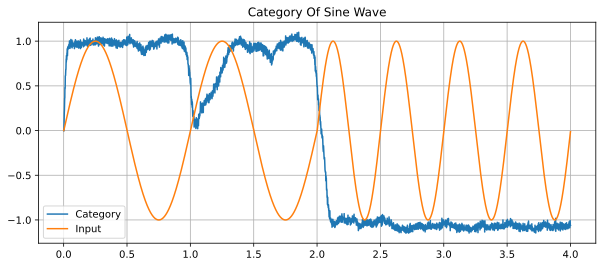

In [37]:
x_values = run_lmu_sim(target)
vals = run_lmu_sim(target, x_values)

**c) Adjusting the input. [1 mark]** Repeat part b) but with an input that is a 2Hz sine wave for the first 2 seconds, and a 1Hz sine wave for the second 2 seconds (i.e. the opposite order as in part (b)).  How well does this perform?  Describe the similarities and differences.  One particular difference you should notice is that the model may make the wrong classification for the first 0.25 seconds.  Why is this happening?  What could you change to fix this?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

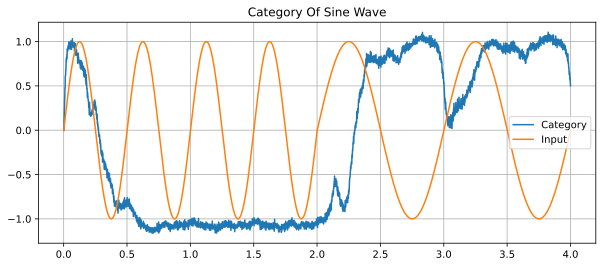

In [38]:
vals = run_lmu_sim(target, x_values, stim_func=lambda t: np.sin(2*np.pi*t*2) if t<2 else np.sin(2*np.pi*t))

This model performs worse than the one from part (b). In particular, the model in (c) makes the wrong classification for the first 0.25 seconds, and takes some time to transition from -1 to 1 in the classification (does not happen exactly at t = 2s). However, the models are similar in the case when the 1 Hz sine wave completes it's first period, where they both drop down to 0 then come back up. Both of these behaviors occur for the same reason: the function they are trained on are for a 1 Hz classification going to a 2 Hz classification. As a result, is struggles to classify a 2 Hz wave first (as seen here, as it classifies 1Hz incorrectly at the beginning). It also knows the transition between 1 Hz and 2 Hz, which is what causes the artifact on the end of the first cycle of the 1 Hz wave. 

To fix this, we would want the target function to have multiple transitions from 1 Hz to 2 Hz - so that is learns the classification from 1 Hz to 2 Hz as well as from 2 Hz to 1 Hz. I tested it below (but removed the cell to save space) and this seemed to be working.

**d) Adjusting the number of neurons. [2 marks]** Repeat part b) but adjust the number of neurons in the `Ensemble` computing the differential equation.  Try 50, 100, 200, 500, 1000, 2000, and 5000.  How does the model behaviour change?  Why does this happen?  In addition to looking at the actual results for each run, also plot the RMSE in the classification as you adjust the number of neurons.  

In [39]:
target = np.zeros(4000)
target[:2000] = 1
target[2000:] = -1
target = target[:, None]
# check the values are as expected
target[:5], target[-5:], target.shape

(array([[1.],
        [1.],
        [1.],
        [1.],
        [1.]]),
 array([[-1.],
        [-1.],
        [-1.],
        [-1.],
        [-1.]]),
 (4000, 1))

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

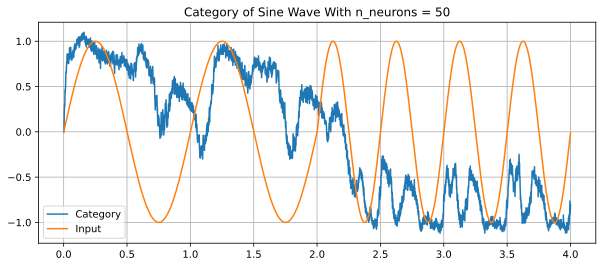

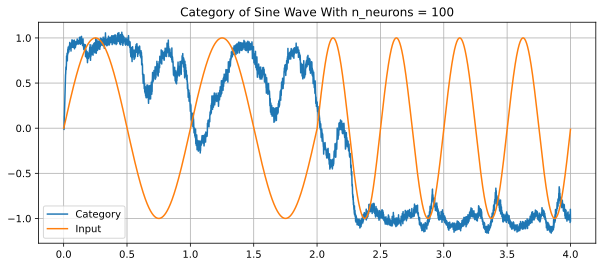

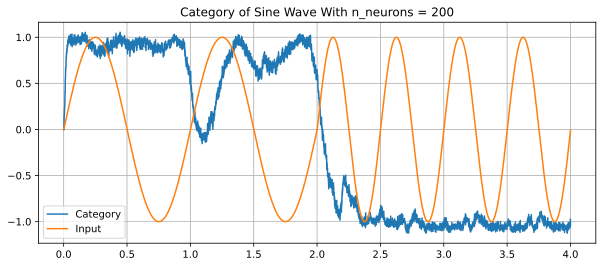

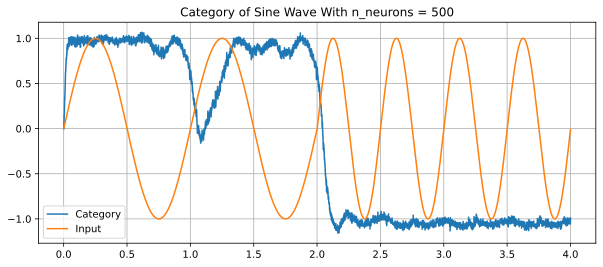

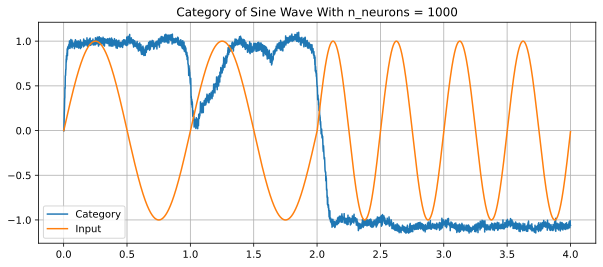

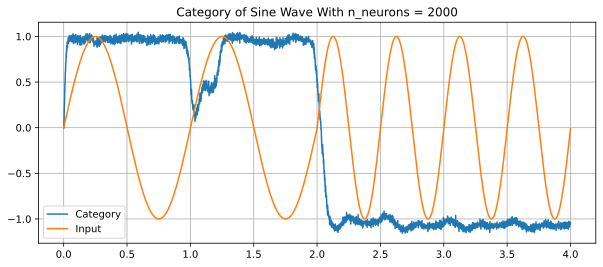

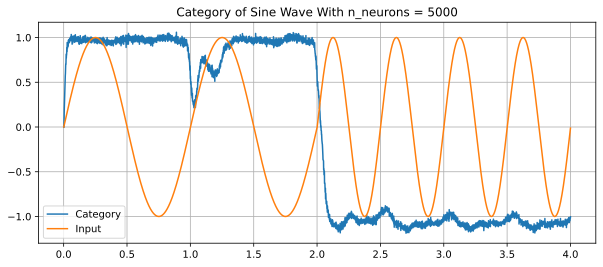

In [40]:
n_neurons_list = [50, 100, 200, 500, 1000, 2000, 5000]
category_rmse_by_n_neurons = []

for n_neurons in n_neurons_list:
    category_vals = run_lmu_sim(target, x_values, n_neurons=n_neurons, title=f"Category of Sine Wave With n_neurons = {n_neurons}")
    rmse = np.sqrt(np.mean(np.square(category_vals - target)))
    category_rmse_by_n_neurons.append(rmse)

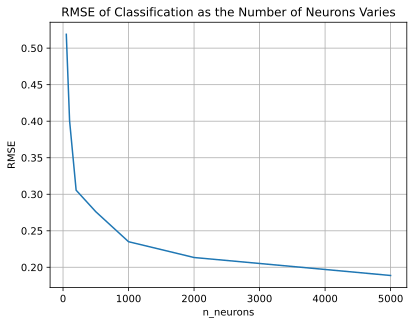

In [41]:
plt.plot(n_neurons_list, category_rmse_by_n_neurons)
plt.title("RMSE of Classification as the Number of Neurons Varies")
plt.xlabel("n_neurons")
plt.ylabel("RMSE")
plt.grid(True)

Questions: How does the model behaviour change?  Why does this happen? The model becomes more stable, visually following the target value better when the number of neurons increases. This is shown in the RMSE plot, as the RMSE drops as the number of neurons is increased. In general, more neurons implies more capacity for the model to capture the recurrent dynamics of the system. Clearly, having 50 neurons to capture the dynamical system is not enough as the neurons cannot capture the state of the system with enough precision. However by increasing the number of neurons we can better capture the input and recurrent connections in the state, which leads to a better model with less error.

**e) Adjusting the q value. [2 marks]** Repeat part b) (returning to 1000 neurons) but adjust the value of `q`.  Try 1, 2, 4, 8, 16, 32, and 64.  How does the model behaviour change?  Why does this happen? In addition to looking at the actual results for each run, also plot the RMSE in the classification as you adjust the number of q values.  

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

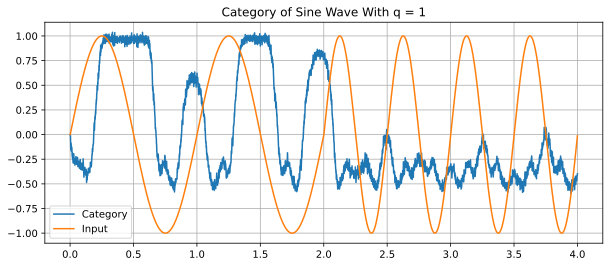

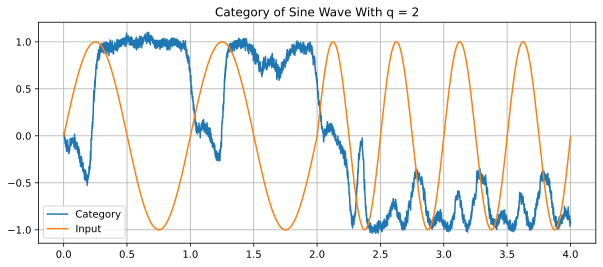

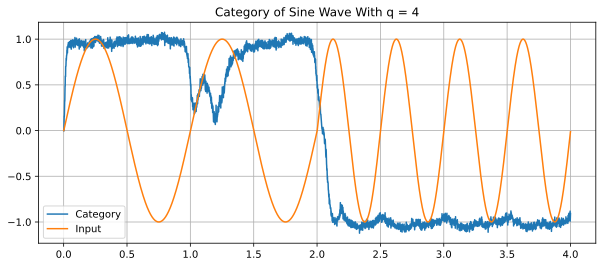

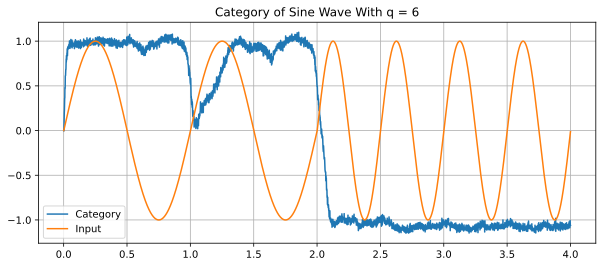

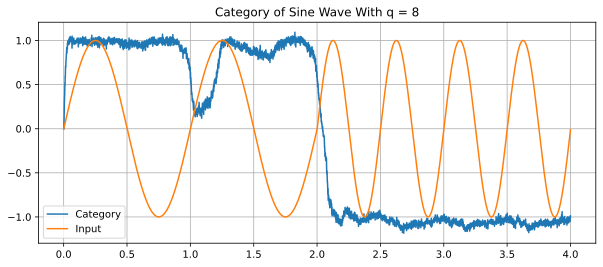

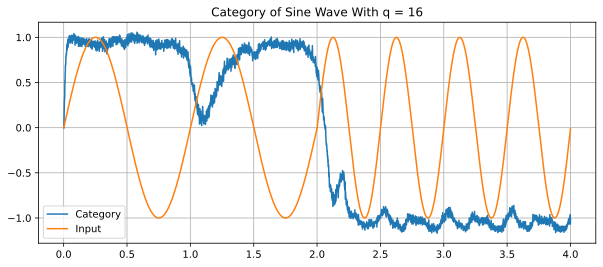

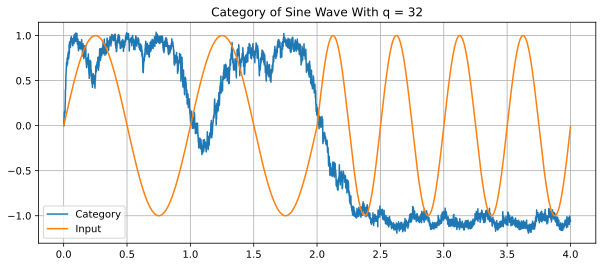

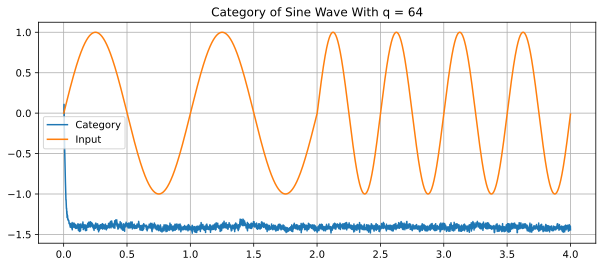

In [42]:
q_list = [1, 2, 4, 6, 8, 16, 32, 64]
category_rmse_by_dimension = []

for q_val in q_list:
    # calculate the x vals for q dim first
    x_vals = run_lmu_sim(target, q=q_val)
    # run the simulation with the calculated x values
    category_vals = run_lmu_sim(target, x_vals, q=q_val, title=f"Category of Sine Wave With q = {q_val}")
    rmse = np.sqrt(np.mean(np.square(category_vals - target)))
    category_rmse_by_dimension.append(rmse)

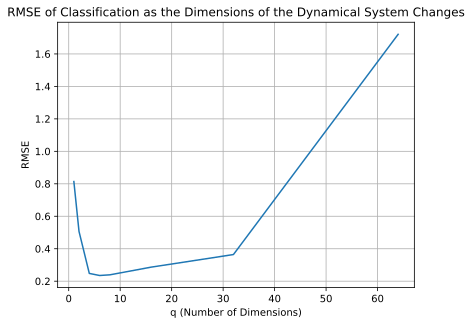

In [43]:
plt.plot(q_list, category_rmse_by_dimension)
plt.title("RMSE of Classification as the Dimensions of the Dynamical System Changes")
plt.xlabel("q (Number of Dimensions)")
plt.ylabel("RMSE")
plt.grid(True)

Questions: How does the model behaviour change?  Why does this happen? For a low number of dimensions (1 and 2) we see bad performance as the system seems to respond to changes in the same way. It seems to not have enough dimensions to represent the concepts in the dynamic system. As we move into the mid dimensional ranges, we see pretty good performance, similar to what we observed before. Finally, when we move into much higher dimensional spaces (64) the model seems to be representing nothing... as it holds a value of -1.5 which is not in the -1 nor 1 value range. 

For lower dimensional spaces, we can think of different concepts being attempted to be represented in a single dimension... which is not feasible. As a result, we do not get good performance of the dynamical system. In high dimensional spaces, we can think of too many conceptss being badly represented and as a result the output is also garbage. When we hit the sweetspot (around 6 dimensions) we can see that the RMSE is the lowest, and the classification most closely follows what we expect. This makes sense since that number of dimensions would be appropriate to represent the dynamical system and provide good information (without noise) for the correct classification to be made. 

# 3. Online Learning

Normally when building models with the Neural Engineering Framework, we compute the connection weights at the beginning and then leave them fixed while running the model.  But, we can also apply online learning rules to adjust the connection weights over time.  This has the effect of changing the function being computed.  One general learning rule is the PES rule, where you provide an extra input that indicates whether the output value should be increased or decreased.  This is generally called an error signal.

**a) Basic online learning. [2 marks]** Build a network that will learn the identity function.  You will need three `Ensembles`, one for the input, one for the output, and one for the error. Each one is 1-dimensional and uses 200 neurons.  For the input, use Nengo to randomly generate a 2Hz band-limited white noise signal as follows:

```python
stim = nengo.Node(nengo.processes.WhiteSignal(period=100, high=2, rms=0.3))
```

When making the learning connection, initialize it to compute the zero function and to use the PES learning rule as follows:
```python
def initialization(x):
    return 0
c = nengo.Connection(pre, post, function=initialization, learning_rule_type=nengo.PES(learning_rate=1e-4))
```

The error `Ensemble` should compute the difference between the output value and the desired output value.  For this initial question, we want the output value to be the same as the input value (i.e. we are learning the identity function).  Then connect the error `Ensemble` to the learning rule as follows:

```python
nengo.Connection(error, c.learning_rule)
```

(Note: for this question, leave the `synapse` values on the `Connections` at their default values)

Run the model for 10 seconds and plot the input value and the resulting output value (using a `Probe` with `synapse=0.01`).  The output should match the input fairly well after the first few seconds.

In [44]:
def identity_function_online_learning(sim_time = 10, lr = 1e-4):
    model = nengo.Network(seed = 10)

    with model:
        # create first ensemble
        pre = nengo.Ensemble(
            n_neurons = 200,
            dimensions = 1
        )

        # create the second ensemble
        post = nengo.Ensemble(
            n_neurons = 200,
            dimensions = 1
        )

        error = nengo.Ensemble(
            n_neurons = 200,
            dimensions = 1
        )

        def initialization(x):
            return 0

        stim = nengo.Node(nengo.processes.WhiteSignal(period=100, high=2, rms=0.3))

        stim_conn = nengo.Connection(stim, pre)
        
        in_out_conn = nengo.Connection(pre, post, function=initialization, learning_rule_type=nengo.PES(learning_rate=lr))

        # error ensemble computes the difference between the output value and the desired output value
        # => error = actual - target = post - pre
        # compute + post
        post_conn = nengo.Connection(post, error)
        # compute -pre
        pre_conn = nengo.Connection(pre, error, function=lambda x: -x)
        error_conn = nengo.Connection(error, in_out_conn.learning_rule)

        # create probes
        stim_probe = nengo.Probe(stim)
        pre_probe = nengo.Probe(pre, synapse=0.01)
        post_probe = nengo.Probe(post, synapse=0.01)
    
    with nengo.Simulator(model) as sim:
        sim.run(sim_time)
    
    return sim, stim_probe, pre_probe, post_probe



In [45]:
sim, stim_probe, pre_probe, post_probe = identity_function_online_learning()

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

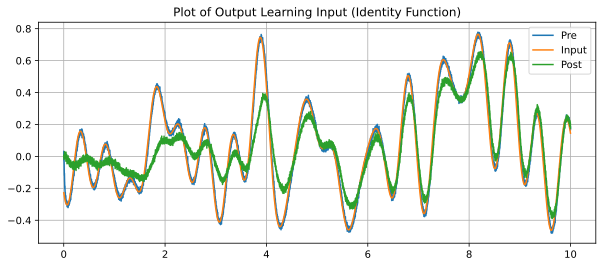

In [46]:
plt.figure(figsize=(10, 4))
plt.plot(sim.trange(), sim.data[pre_probe], label="Pre")
plt.plot(sim.trange(), sim.data[stim_probe], label="Input")
plt.plot(sim.trange(), sim.data[post_probe], label="Post")
plt.title("Plot of Output Learning Input (Identity Function)")
plt.legend()
plt.grid()

**b) Error calculation. [1 mark]**  What would happen if you reversed the sign of the error calculation (i.e. if you did `target - output` rather than `output - target`?  Why does that happen?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

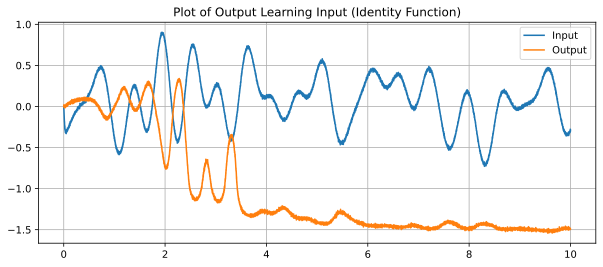

In [47]:
def wrong_model_test():
    model = nengo.Network(seed = 12)

    with model:
        # create first ensemble
        pre = nengo.Ensemble(
            n_neurons = 200,
            dimensions = 1
        )

        # create the second ensemble
        post = nengo.Ensemble(
            n_neurons = 200,
            dimensions = 1
        )

        error = nengo.Ensemble(
            n_neurons = 200,
            dimensions = 1
        )

        def initialization(x):
            return 0

        stim = nengo.Node(nengo.processes.WhiteSignal(period=100, high=2, rms=0.3))

        stim_conn = nengo.Connection(stim, pre)
        
        in_out_conn = nengo.Connection(pre, post, function=initialization, learning_rule_type=nengo.PES(learning_rate=1e-4))

        # test flipping, error = target - output = pre - post
        post_conn = nengo.Connection(post, error, function=lambda x: -x)
        pre_conn = nengo.Connection(pre, error)
        error_conn = nengo.Connection(error, in_out_conn.learning_rule)

        # create probes
        input_probe = nengo.Probe(pre, synapse=0.01)
        output_probe = nengo.Probe(post, synapse=0.01)

    with nengo.Simulator(model) as sim:
        sim.run(10)

    plt.figure(figsize=(10, 4))
    plt.plot(sim.trange(), sim.data[input_probe], label="Input")
    plt.plot(sim.trange(), sim.data[output_probe], label="Output")
    plt.title("Plot of Output Learning Input (Identity Function)")
    plt.legend()
    plt.grid()
wrong_model_test()

By doing the opposite, we are computing the negative error value. In this case, we would say that the error is `target - output` = `input - output`. Take the case where output > input, then the error becomes negative (where we really should have a positive error). The weights get updated proportionally to the negative error in the PES learning rule, and as a result the weights get updated in the wrong direction. This results in the updated weights increasing the error even more, until it saturates at it's max value. This is observed above. We note that given that the input is random, it could also happen that the error accumulates and saturates the negative value (when input > output). In the end, the output will get pushed to either + or - the saturation value as a result of the backward update in the weights from the learning rule.

**c) Computing metrics. [1 mark]**  Break your data up into 2-second chunks and compute the Root-Mean-Squared-Error between the target value (the stimulus itself) and the output from the model for each chunk.  Since the simulation is 10 seconds long, you should have 5 RMSE measures (one for the first 2 seconds, one for the second 2 seconds, one for the third 2 seconds, and so on).  Repeat the simulation 10 times and plot the average for each of these values.  The result should show that the model gets better over time, but does not reach 0 error.  

In [48]:
sim.data[stim_probe].shape, sim.data[post_probe].shape

((10000, 1), (10000, 1))

In [49]:
chunks = int(sim.data[stim_probe].shape[0] / (2 * 1000))
chunks

5

In [50]:
stim_split = np.array_split(sim.data[stim_probe], 5)
output_split = np.array_split(sim.data[post_probe], 5)
len(stim_split), stim_split[0].shape

(5, (2000, 1))

In [51]:
def compute_chunk_rmse(desired_chunks, target_chunks):
    rmse_by_chunk = []
    for desired_chunk, target_chunk in zip(desired_chunks, target_chunks):
        rmse = np.sqrt(np.mean(np.square(desired_chunk - target_chunk)))
        rmse_by_chunk.append(rmse)
    return rmse_by_chunk

In [52]:
compute_chunk_rmse(stim_split, output_split)

[0.17739568955895516,
 0.1782768536680706,
 0.11757464902946424,
 0.08491251128590281,
 0.08635297073344708]

In [53]:
# write a helper function to run the simulation 10 times with varying parameters
def compute_rmse_in_chunks_sim(sim_time = 10, lr = 1e-4, chunk_time = 2):
    sim, stim_probe, pre_probe, post_probe = identity_function_online_learning(sim_time=sim_time, lr=lr)
    chunks = int(sim.data[stim_probe].shape[0] / (chunk_time * 1000))
    stim_split = np.array_split(sim.data[stim_probe], chunks)
    output_split = np.array_split(sim.data[post_probe], chunks)
    rmse_by_chunk = compute_chunk_rmse(stim_split, output_split)
    return np.array(rmse_by_chunk)

In [54]:
np.arange(0, 10/2).astype(int)

array([0, 1, 2, 3, 4])

In [55]:
def plot_mean_rmse_by_chunks(n_runs, sim_time = 10, lr = 1e-4):
    all_rmse = []
    for _ in range(n_runs):
        run_rmse_chunks = compute_rmse_in_chunks_sim(sim_time=sim_time, lr=lr)
        all_rmse.append(run_rmse_chunks)
    all_rmse = np.array(all_rmse)
    # print(all_rmse.shape)
    mean_rmse_by_chunk = np.mean(all_rmse, axis = 0)
    # print(mean_rmse_by_chunk.shape)
    plt.plot(np.arange(0, sim_time/2).astype(int), mean_rmse_by_chunk, marker="o")
    plt.grid()
    plt.xlabel("Chunk Number [Corresponds to 2s Interval]")
    plt.ylabel("RMSE")
    plt.title(f"RMSE as Time Increases for Sim Time = {sim_time} and lr = {lr}")

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

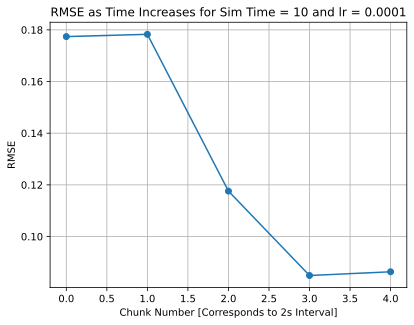

In [56]:
plot_mean_rmse_by_chunks(10)

**d) Increasing learning time. [1 mark]**  Repeat part (c), but run the model for 100 seconds instead of 10 seconds.  How do the results change?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

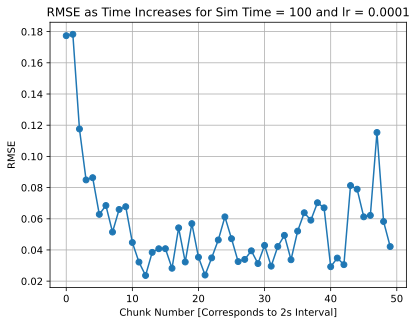

In [57]:
plot_mean_rmse_by_chunks(10, sim_time=100)

When we run for 100 seconds instead of 10, we can see how the RMSE stabilizes after reaching good performance. In the 10 second version, the RMSE monotonically decreases, but we cannot see how the learning trend would continue. In the 100 second version, we can see learning improve up to about the first 15 chunks (30 seconds) and then worse/similar performance after that over time. The reason for this is that the error is already very small and the stimulus is random.. thus a weird pattern in the stimulus could increase the error (as seen around chunk 47), but in general the error stays low. It shows us that after 100 seconds, the identity function has been learned quite well, and has close to 0 error.

**e) Learning rates. [1 mark]**  Repeat part (d), but decrease the learning rate to `1e-5`.  How do the results change?  How do they compare to part (c)?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

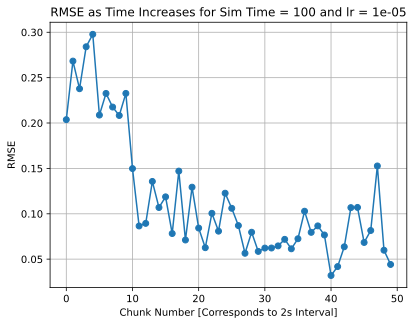

In [58]:
plot_mean_rmse_by_chunks(10, sim_time=100, lr = 1e-5)

Compared to the previous section, we can see that the RMSE is higher everywhere and seems to be taking a longer time to decrease (ie. it is taking a longer time to 'learn' the function). This makes sense since the smaller learning rate means that the weights are changed by a smaller amount, resulting in a slower learning process. Given the same amount of time ran, we can expect a higher error with the smaller learning rate since the weights have been shifted less strongly towards their optimial value, as observed. Compared to the results in (c) and considering only the first 5 chunks (since c only had 5 chunks) we can see that the error is much higher and actually increases before decreasing (whereas the error in c always decreased). This is likely a result of the weights starting off badly and learning slowly at first, even learning a worse function before learning more optimal weights in this case. 

**f) Improving performance. [1 mark]**  If you wanted to make the learned result even more accurate, how would you do this?  What would you change about the model and learning process?

In order to make the learned results even more accurate assuming the same input (stim) signal, we can take a look at various parameters that we can vary. As for the model, we would keep the same base to the model, but may consider adding more neurons into all of our ensembles to have a larger capacity to learn. Given a larger capacity, we might expect longer training times - and should also consider tweaking the learning process by adding some regularization/normalzation (to prevent the weights from overfitting). Furthermore, for the learning process we can consider changing the learning rate and evaluating it's effect on accuracy. Given that we may run the model for longer, we should test out learning rates above and below what has already been tested to know if certain value is able to find a more optimal solution to the function that we are computing. I would vary these things one at a time and evaluate their performance as above to end up with a more accurate learned result.

**g) Learning other functions. [1 mark]** Repeat part (a), but have the system learn a function where the input is a scalar $x$, but the output is the vector $[x^2, -x]$.  This will involve changing the dimensionality of some of the `Ensembles` and adding a `function=` to be computed on the `Connection` from the `stim` to the `error`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

Text(0, 0.5, 'Error')

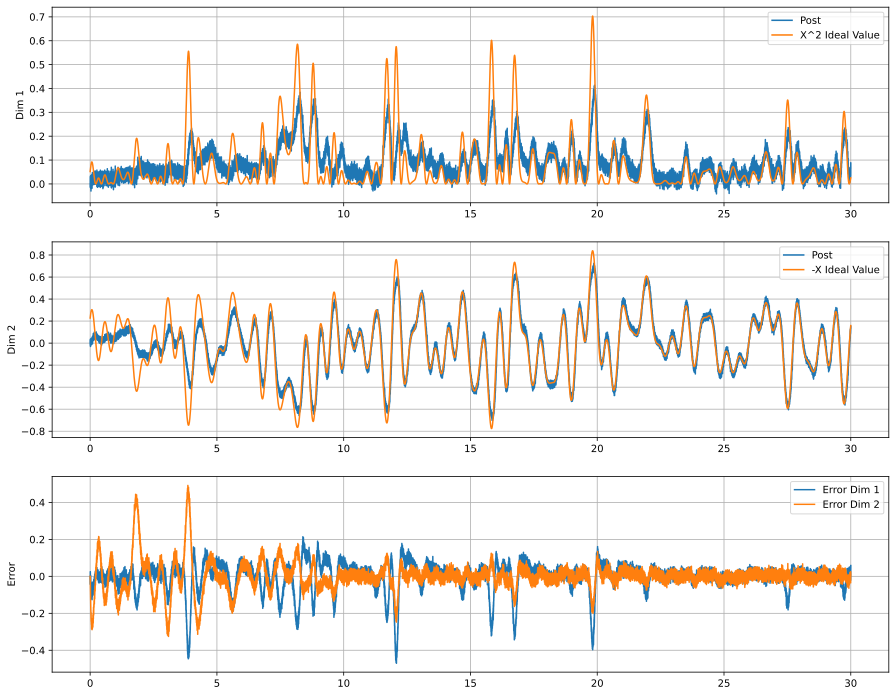

In [59]:
model = nengo.Network(seed = 10)

with model:
    # create first ensemble
    pre = nengo.Ensemble(
        n_neurons = 200,
        dimensions = 1
    )

    # create the second ensemble
    post = nengo.Ensemble(
        n_neurons = 200,
        dimensions = 2
    )

    error = nengo.Ensemble(
        n_neurons = 200,
        dimensions = 2
    )

    def initialization(x):
        return [0, 0]
    
    def target_functions(x):
        # => error = actual - target => e[0] = post[0] - (pre ** 2) and e[1] = post[1] - (- pre)
        # note that target functions are only on pre above
        x_out = [0, 0]
        x_out[0] = -(x ** 2)
        x_out[1] = x
        return x_out

    stim = nengo.Node(nengo.processes.WhiteSignal(period=100, high=2, rms=0.3))

    stim_conn = nengo.Connection(stim, pre)
    
    in_out_conn = nengo.Connection(pre, post, function=initialization, learning_rule_type=nengo.PES(learning_rate=1e-4))

    # error ensemble computes the difference between the output value and the desired output value
    # => error = actual - target => e[0] = post[0] - (pre ** 2) and e[1] = post[1] - (- pre)
    # compute + post (in both dimensions/cases)
    post_conn = nengo.Connection(post, error)
    # compute the functions above... as mentioned on the connection from stim to error (for me will be pre to error)
    pre_conn = nengo.Connection(pre, error, function=target_functions)
    error_conn = nengo.Connection(error, in_out_conn.learning_rule)

    # create probes
    stim_probe = nengo.Probe(stim)
    pre_probe = nengo.Probe(pre, synapse=0.01)
    post_probe = nengo.Probe(post, synapse=0.01)
    error_probe = nengo.Probe(error, synapse=0.01)
    
    with nengo.Simulator(model) as sim:
        sim.run(30)
    
plt.figure(figsize=(15, 12))

plt.subplot(3, 1, 1)
plt.plot(sim.trange(), sim.data[post_probe].T[0], label="Post")
plt.plot(sim.trange(), sim.data[stim_probe]**2, label="X^2 Ideal Value")
plt.grid()
plt.ylabel("Dim 1")
# plt.plot(sim.trange(), sim.data[error_probe].T[0], label="Error")
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(sim.trange(), sim.data[post_probe].T[1], label="Post")
plt.plot(sim.trange(), -sim.data[stim_probe], label="-X Ideal Value")
plt.grid()
# plt.plot(sim.trange(), sim.data[error_probe].T[1], label="Error")
plt.legend()
plt.ylabel("Dim 2")

plt.subplot(3, 1, 3)
plt.plot(sim.trange(), sim.data[error_probe].T[0], label="Error Dim 1")
plt.plot(sim.trange(), sim.data[error_probe].T[1], label="Error Dim 2")
plt.legend()
plt.grid()
plt.ylabel("Error")

# 4. Representation and Function Analysis

**a) SVD. [1 mark]** In class we looked at the utility of doing SVD to better understand what functions could be computed by a population of neurons. What matrix did we do SVD on? Why is that the right matrix to decompose? Name one way of understanding what the decomposition tells us about the matrix.

When doing SVD to understand what functions could be computed by a population of neurons, we did SVD on the gamma matrix, which is  `gamma = A.T @ A` in python operators. Note that in general for computing decoders, we had: `D = inv(A.T @ A) @ A.T @ X` which we used for all decoders (thus is highly important) and can be written as `D = U @ S_inv @ U.T @ A.T @ X` where the gamma matrix has been decomposed via `gamma = U @ S @ U.T`. Evidently, this matrix plays a role in all decodings, thus it should give us information about what representations are possible.

One way of understanding what the decomposition tells us about the matrix is by analyzing the U and S matricies. The U matrix yields an orthogonal basis for the range and nullity of the gamma matrix, which tells us about the subspace that the neuron activities span. They are useful for understanding the space since the activities give us a basis which is not orthogonal (where we can view orthogonal bases as "independant" in a sense). Furthermore, the S matrix contains the singular values, which tell us about the relative importance of each of the basis from the U matrix. That is, the larger a singular value, the more the corresponding vector in the U matrix matters in terms of producing the neural activity space, which helps us understand the important components of the neural correlations. Thus, the decomposition tells us what the important (orthogonal) components of the matrix are, and their relative importance. 

**b) Noise and SVD. [1 mark]** We discussed how to incorporate noise into our SVD analysis. What does the relationship between the variance of the noise and the size of the singular value for a particular dimension tell us about the resulting representation? Use equations.

The relationship between variance of noise and size of a singluar value can be analyzed in the error representation under noise. We can start by looking at the error of actual value to neural represented value under noise, and after algebraic simplifications, we can take the derivative with respect to decoders and set to 0 to find optimal decoders. After doing this, we find the equation of the optimal decoders as `phi_n = (<Xn * x> sub_x) / (Sn + sigma_n**2)` where `Sn` is the singular value, and `sigma_n**2` is the variance of the noise. We can see that the optimal decoders as scaled by the sum of the singular value and the variance under noise. More specifically, if the SNR is <= 1 (the singular value is less than or equal to noise variance) than we can tell that noise is taking over the representation, and we cannot represent that value well. Thus, in the case that the singular value is less than noise variance, we can simply disregad the term as it will not be representing a proper value (it will introduce noise into the representation). However, if the singluar value is greater than the noise variance, it tells us that the resulting representation is not distorted by noise so we can trust the decoders. 

# 5. The Semantic Pointer Architecture

To make building models with the SPA easier, the Nengo ecosystem includes ```nengo.spa```, which allows you to quickly build simple cognitive models. You can use it as follows:

```python
import nengo.spa as spa
```

In this part of the assignment, we will build a simple SPA model that takes a visual input and memorizes it for a period of time. In ```nengo.spa``` some of the commands are different because you're working in a high dimensional space. For this question, use 32 dimensions. Also, be sure to set the random seed to 0 after importing ```nengo.spa```. To prepare the environment for your model, you need to initialize a vocabulary:

```python
vocab = spa.Vocabulary(dimensions=32)
```

You can define an input function for a node as usual. However, the returned values  have to be vectors, and often ones from your vocabulary:

```python
return vocab['CAT'].v
```

When you first name a vocabulary entry, a random semantic pointer (SP) will be added to the vocabulary for you. The ```.v``` tells the vocab to return the vector value assocaited with that SP.

To take advantage of the SPA, you need to make your model an SPA network:

```python
model = spa.SPA()

with model:
```

You can now define high dimensional representations using the ```State``` object:

```python
model.visual_input = spa.State(dimensions=32)
```

Unlike normal populations, you have to use the ```model``` identifier when adding objects into the network.  Also, because ```State``` objects have structure, you need to connect to their ```inputs``` and ```outputs```:

```python
nengo.Connection(model.visual_input.output, model.memory.input, transform=0.1)
```

The same is true when you probe these neural populations:
```python
out = nengo.Probe(model.memory.output, synapse=0.03)
```

Finally, when plotting the output from these models, you often want to use the ```similarity``` function in concert with your ```vocab``` so you can generate plots like those from the GUI:

```python
plt.plot(sim.trange(), spa.similarity(sim.data[out], vocab))
```

*TIP: The Nengo GUI built-in tutorials 19 through 25 may be useful to give you an overview of different ways of using ```nengo.spa```.*

**a) Generate a visual input. [2 marks]** Build an SPA network that has a single ```State``` population that takes input from a node, which alternates between CAT and DOG representations every 400ms for 1.6s, and then returns the zero vector the rest of the time. Show a similarity plot over 2 seconds demonstrating the correct representation in the population. Explain what the similarity plot is showing.

In [60]:
import nengo.spa as spa

vocab = spa.Vocabulary(dimensions=32)

print(vocab["CAT"].v, vocab["DOG"].v)


[-0.05762172 -0.06289267 -0.16086844 -0.07198092  0.33961119  0.04320234
 -0.16285394 -0.07607007  0.07123466 -0.22709504 -0.25233362 -0.09425518
  0.12330299  0.17800606  0.2086501   0.04486888 -0.1380425   0.4492455
 -0.08278204  0.07758307 -0.22897298  0.17225853 -0.11083821 -0.03297898
 -0.26113081  0.15261563 -0.10645881  0.17533242  0.12556409 -0.21386502
  0.17727459  0.18655599] [ 0.07970418 -0.04460327  0.11873005 -0.0782564  -0.41187034 -0.17649542
 -0.33892435  0.11132805 -0.04164769  0.21401097 -0.0913157   0.09264629
 -0.04351739  0.0197535   0.12273736 -0.21217012  0.16449216 -0.13008999
  0.01219859  0.03870673 -0.08253301  0.00659973 -0.18417902 -0.0077209
  0.30865096 -0.09397472  0.04206513 -0.33783342  0.26527097  0.21623682
 -0.29557687  0.07489046]


In [61]:
model = spa.SPA(seed=0)

with model:
    model.visual_input = spa.State(dimensions=32)

    def visual_input_function(t):
        if t < 1.6:
            if int(t * 2.5) % 2 == 0:
                return vocab['CAT'].v
            else:
                return vocab['DOG'].v
        else:
            return np.zeros(32)

    input = nengo.Node(visual_input_function)
    nengo.Connection(input, model.visual_input.input)
 
    visual_input_probe = nengo.Probe(model.visual_input.output, synapse=0.01)

with nengo.Simulator(model) as sim:
        sim.run(2.5)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

Text(0.5, 1.0, 'Similarity Plot Between CAT and DOG over 2.5 seconds')

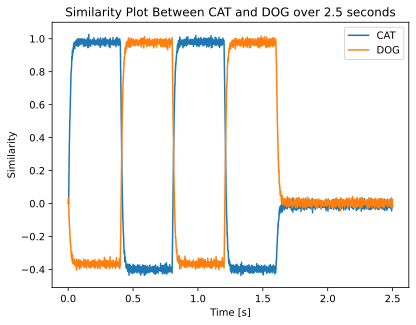

In [62]:
similarities = spa.similarity(sim.data[visual_input_probe], vocab)
plt.plot(sim.trange(), similarities[:, vocab.keys.index("CAT")], label="CAT")
plt.plot(sim.trange(), similarities[:, vocab.keys.index("DOG")], label="DOG")
plt.xlabel("Time [s]")
plt.ylabel("Similarity")
plt.legend()
plt.title("Similarity Plot Between CAT and DOG over 2.5 seconds")

The similarity plot is showing which semantic pointer (either "CAT", "DOG", or 0) is being represented by the internal state of the visual input. When we put "CAT" in the model, we can see that the network shows "CAT" being represented, while "DOG" is not represented. The opposite is true when "DOG" is show. Finally, they go to 0 once the input shown is also the 0 vector.

With the semantics of this question, if we think of the state as visual input, then the similarity plot is showing what visual input our model is seeing (ie. is it seeing CAT, DOG, or nothing). We can think of it as a very basic sensory system, percieving the environment and recording the result in a semantic vector.

**a) Add a working memory. [1 mark]** Add a working memory population to the previous network by setting ```feedback=1``` on a new ```State``` population.  Connect the visual input to the working memory and scale the input by 0.1. Show a similarity plot of the working memory output. 

In [63]:
model = spa.SPA(seed=0)

with model:
    model.visual_input = spa.State(dimensions=32)
    model.memory = spa.State(dimensions=32, feedback=1)

    def visual_input_function(t):
        if t < 1.6:
            if int(t * 2.5) % 2 == 0:
                return vocab['CAT'].v
            else:
                return vocab['DOG'].v
        else:
            return np.zeros(32)

    input = nengo.Node(visual_input_function)
    nengo.Connection(input, model.visual_input.input)
    nengo.Connection(model.visual_input.output, model.memory.input, transform=0.1)
    memory_probe = nengo.Probe(model.memory.output, synapse=0.01)
 
with nengo.Simulator(model) as sim:
    sim.run(4)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

Text(0.5, 1.0, 'Similarity Plot Between CAT and DOG In Working Memory')

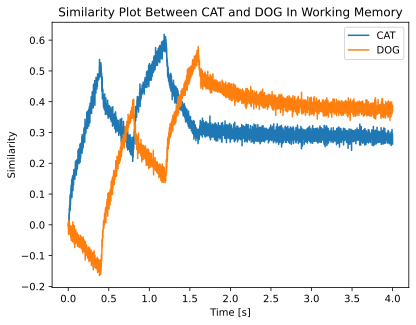

In [64]:
similarities = spa.similarity(sim.data[memory_probe], vocab)
plt.plot(sim.trange(), similarities[:, vocab.keys.index("CAT")], label="CAT")
plt.plot(sim.trange(), similarities[:, vocab.keys.index("DOG")], label="DOG")
plt.xlabel("Time [s]")
plt.ylabel("Similarity")
plt.legend()
plt.title("Similarity Plot Between CAT and DOG In Working Memory")

**a) Testing the model. [1 mark]** Run the model for 20s. Show the plots. Explain what you see in both the visual input and memory populations. Do you see any primacy or recency effects? How good is the working memory population?  How long do you think it will retain the memory of a CAT and/or a DOG? Is that reasonable, why or why not?

In [65]:
model = spa.SPA(seed=0)

with model:
    model.visual_input = spa.State(dimensions=32)
    model.memory = spa.State(dimensions=32, feedback=1)

    def visual_input_function(t):
        if t < 1.6:
            if int(t * 2.5) % 2 == 0:
                return vocab['CAT'].v
            else:
                return vocab['DOG'].v
        else:
            return np.zeros(32)

    input = nengo.Node(visual_input_function)
    nengo.Connection(input, model.visual_input.input)
    nengo.Connection(model.visual_input.output, model.memory.input, transform=0.1)
    memory_probe = nengo.Probe(model.memory.output, synapse=0.01)
    visual_input_probe = nengo.Probe(model.visual_input.output, synapse=0.01)
 
with nengo.Simulator(model) as sim:
    sim.run(20)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

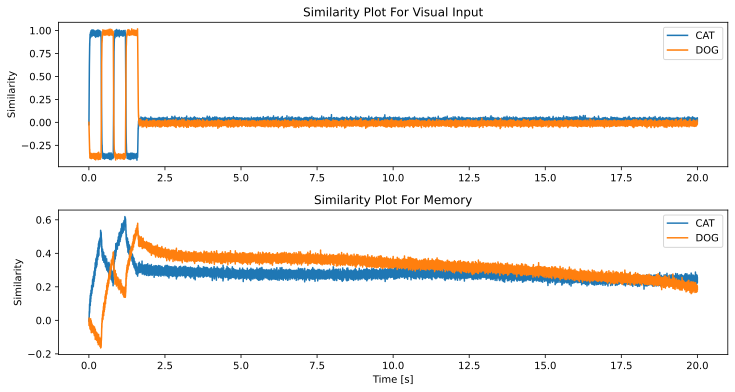

In [66]:
visual_input_similarity = spa.similarity(sim.data[visual_input_probe], vocab)
memory_similarity = spa.similarity(sim.data[memory_probe], vocab)

plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(sim.trange(), visual_input_similarity[:, vocab.keys.index("CAT")], label="CAT")
plt.plot(sim.trange(), visual_input_similarity[:, vocab.keys.index("DOG")], label="DOG")
# plt.xlabel("Time [s]")
plt.ylabel("Similarity")
plt.legend()
plt.title("Similarity Plot For Visual Input")

plt.subplot(2, 1, 2)
plt.plot(sim.trange(), memory_similarity[:, vocab.keys.index("CAT")], label="CAT")
plt.plot(sim.trange(), memory_similarity[:, vocab.keys.index("DOG")], label="DOG")
plt.xlabel("Time [s]")
plt.ylabel("Similarity")
plt.legend()
plt.title("Similarity Plot For Memory")

plt.subplots_adjust(hspace=0.3)

In the visual input population, we see a balanced representation of CAT and DOG for the first 1.6 seconds, followed by zero visual input. We note that both DOG and CAT are shown for the same total length of time, and are being represented as visual input with similar magnitude. Comparing this to the memory population, we can see that CAT is represented better than DOG. There is a primacy effect, as CAT is shown first and is showing a better representation than DOG, even though both are being shown for the same length of time. However, as time goes on, it appears that DOG is keeping it's representation, while CAT is losing value. Note that in some simulations, CAT does not show a decline like the one here as time goes on, thus we still consider this a primacy effect.

It seems like the memory system has retained both CAT and DOG in it's memory... and it will be retained for a long time (I would guess 100+ seconds, but hard to say with certainty). This is reasonable as we hold on to memories of things that happen for some time, unless they are superceded by more information (recency effects). If it is the last thing shown, I would expect it to persist in working memory.

Overall, the working memory population seems to be performing well. 